# Machine learning of dieletctric constant using persistent vector as descriptor
### Effect of vector selection on training accuracy

In [59]:
import os  # for makedirs
import homcloud.interface as hc  # HomCloud 
import homcloud.paraview_interface as pv # HomCloud <-> paraview interface
import numpy as np  # Numerical array library
from tqdm import tqdm_notebook as tqdm  # For progressbar
import matplotlib.pyplot as plt  # Plotting
import sklearn.linear_model as lm  # Machine learning
from sklearn.decomposition import PCA  # for PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import pickle
from sklearn.svm import SVR
import scipy as sp

In [60]:
pdvects = pd.DataFrame()
list_ = []
for i in range(0,228) :
    df = pd.read_table("pd_vector/p{:03d}.dat".format(i), dtype='float64')
    df.columns=["{:03d}".format(i)]
    list_.append(df)
pdvects = pd.concat(list_,axis=1)
pdvects2 = pdvects.T
pdvects2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048,2049,2050,2051,2052,2053,2054,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064,2065,2066,2067,2068,2069,2070,2071,2072,2073,2074,2075,2076,2077,2078,2079
000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002441,0.0,0.0,0.0,0.0,0.0,0.013123,0.0,0.0,0.0,0.0,0.0,0.0,0.359192,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.534973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.048828,1.996765,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.471190,2.536926,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.016479,0.283203,2.180786,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.024719,0.610350,2.792358,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.019529,0.247187,1.887203,3.627624,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038128,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003357,0.0,0.0,0.0,0.0,0.0,0.013123,0.0,0.0,0.0,0.0,0.0,0.0,0.264893,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.481567,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061035,1.709289,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.361327,2.637939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.327148,2.932434,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.074156,1.123045,3.788757,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.019529,0.609727,2.592768,4.563598,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000305,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.539245,0.000000,0.000000,0.000000,1.529606,1.526597,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003357,0.0,0.0,0.0,0.0,0.0,0.016785,0.0,0.0,0.0,0.0,0.0,0.0,0.235901,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.450134,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.029297,1.604919,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.319824,2.649536,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.008240,0.371093,3.210754,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.082396,1.210935,4.098511,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.039058,0.659165,3.066400,4.779053,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038128,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003357,0.0,0.0,0.0,0.0,0.0,0.014038,0.0,0.0,0.0,0.0,0.0,0.0,0.2316

In [61]:
pdvects_all = np.array(pdvects2)
sc = StandardScaler()
pdvects_all2 = sc.fit_transform(pdvects_all)
pdvects_all2

array([[ 0.        ,  0.        ,  0.        , ..., -0.5385537 ,
        -0.82057006,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.5385537 ,
        -0.82057006,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.5385537 ,
        -0.82057006,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.67719129,
        -0.82057006,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.5385537 ,
         0.46674627,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.5385537 ,
        -0.39146462,  0.        ]])

In [62]:
pd_vects_std = pdvects_all2 / pdvects_all2.max()
pd_vects_std

array([[ 0.        ,  0.        ,  0.        , ..., -0.03574506,
        -0.05446315,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.03574506,
        -0.05446315,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.03574506,
        -0.05446315,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.04494676,
        -0.05446315,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.03574506,
         0.03097904,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.03574506,
        -0.02598242,  0.        ]])

In [28]:
!pip install scikit-learn

In [63]:
pca = PCA(n_components=100)
pca.fit(pd_vects_std)

PCA(n_components=100)

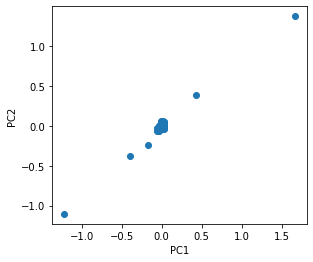

In [64]:
reduced = pca.transform(pd_vects_std)
plt.gca().set_aspect('equal') 

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.scatter(reduced[0],reduced[1])

In [31]:
pca.explained_variance_ratio_

array([0.3459605 , 0.12525453, 0.05105681, 0.01463202, 0.01149038,
       0.01069834, 0.01000705, 0.00848499, 0.00814318, 0.00776661,
       0.00741936, 0.00702073, 0.00631768, 0.00616892, 0.00594925,
       0.00580904, 0.00560989, 0.00540556, 0.00506511, 0.00497364,
       0.0047067 , 0.00457128, 0.00455999, 0.00436375, 0.00421197,
       0.0041722 , 0.00407117, 0.00405559, 0.00396193, 0.00392812,
       0.00381402, 0.00373621, 0.00365745, 0.00360828, 0.00354977,
       0.00349338, 0.00344728, 0.00338905, 0.00334815, 0.00330253,
       0.00322843, 0.00322639, 0.00317819, 0.0031704 , 0.00313673,
       0.00313047, 0.0030557 , 0.00300054, 0.00293658, 0.00291458,
       0.00290099, 0.00285537, 0.00281779, 0.00277265, 0.00275161,
       0.00273935, 0.00269785, 0.00265695, 0.00263568, 0.00263427,
       0.00259963, 0.00258968, 0.00254541, 0.00253026, 0.00248396,
       0.0024705 , 0.00246599, 0.00242778, 0.00240562, 0.00238067,
       0.00235656, 0.00233806, 0.00232229, 0.00229558, 0.00229

In [32]:
res = np.cumsum(pca.explained_variance_ratio_[:])
res

array([0.3459605 , 0.47121503, 0.52227184, 0.53690386, 0.54839423,
       0.55909257, 0.56909962, 0.57758461, 0.58572778, 0.5934944 ,
       0.60091376, 0.60793449, 0.61425217, 0.62042109, 0.62637033,
       0.63217937, 0.63778926, 0.64319483, 0.64825994, 0.65323358,
       0.65794028, 0.66251156, 0.66707155, 0.6714353 , 0.67564727,
       0.67981946, 0.68389063, 0.68794622, 0.69190815, 0.69583628,
       0.6996503 , 0.70338651, 0.70704396, 0.71065224, 0.71420201,
       0.7176954 , 0.72114268, 0.72453172, 0.72787987, 0.7311824 ,
       0.73441083, 0.73763722, 0.74081542, 0.74398582, 0.74712255,
       0.75025302, 0.75330872, 0.75630926, 0.75924584, 0.76216042,
       0.76506141, 0.76791677, 0.77073456, 0.77350721, 0.77625882,
       0.77899816, 0.78169601, 0.78435296, 0.78698864, 0.78962291,
       0.79222254, 0.79481222, 0.79735763, 0.7998879 , 0.80237185,
       0.80484235, 0.80730835, 0.80973612, 0.81214174, 0.81452241,
       0.81687897, 0.81921703, 0.82153932, 0.8238349 , 0.82612

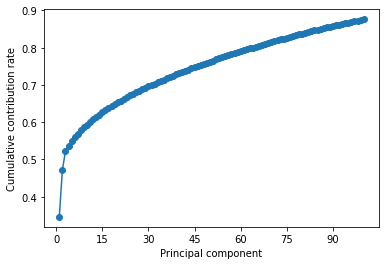

In [33]:
import matplotlib.ticker as ticker

plt.gca().get_xaxis().set_major_locator(ticker.MaxNLocator(integer=True))
plt.xlabel("Principal component")
plt.ylabel("Cumulative contribution rate")
#plt.scatter([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20], res)

plt.plot(np.arange(1,101),res)
plt.scatter(np.arange(1,101), res)

In [34]:
reduced

array([[-1.22169353,  1.66996471, -0.17246922, ..., -0.00541486,
         0.00634083,  0.02696834],
       [-1.10334556,  1.3698875 , -0.24158712, ..., -0.00277174,
         0.02695232, -0.02025829],
       [-1.16591782,  1.30916573, -0.2174987 , ...,  0.00279634,
        -0.00902412, -0.01170965],
       ...,
       [-0.21849853, -0.16571204, -0.65965173, ...,  0.01815434,
         0.04430474,  0.16754317],
       [ 0.07977253, -0.08749598, -0.55094702, ...,  0.10412405,
         0.04809052,  0.2223314 ],
       [-0.00511198, -0.67387334, -0.52553445, ...,  0.18093152,
         0.03176099, -0.08897966]])

### Loading dielectric constant

In [35]:
dc3__= np.loadtxt("DC_result.dat", skiprows = 1, usecols =(1))
dc3__

array([1.05408362, 1.18867284, 1.17745153, 1.19282481, 1.17063452,
       1.1448491 , 1.147685  , 1.11858476, 1.07697557, 1.04903497,
       1.01344656, 1.07556949, 1.16033186, 1.15113035, 1.19080523,
       1.22560828, 1.21596193, 1.24927047, 1.22827692, 1.0153738 ,
       1.01724022, 1.0061696 , 1.01205201, 1.01087698, 1.01864735,
       1.01215573, 1.00640363, 1.0184576 , 1.01681518, 1.00675374,
       1.03222667, 1.02554789, 1.00601529, 1.01498606, 1.02295548,
       1.01123896, 1.0080444 , 1.01659358, 1.00761531, 1.00233126,
       1.0301098 , 1.00760745, 1.01028621, 1.01586576, 1.02727596,
       1.03002307, 1.01330018, 1.00696604, 1.02347571, 1.03858098,
       1.00692084, 1.02426239, 1.02674287, 1.02365531, 1.01573205,
       1.03033169, 1.02599594, 1.03183812, 1.02366584, 1.03649243,
       1.0440387 , 1.0390934 , 1.01761408, 1.04673776, 1.05008524,
       1.05291411, 1.0421442 , 1.0214757 , 1.02035402, 1.02948792,
       1.0281735 , 1.02844498, 1.03535195, 1.0489398 , 1.03960

In [36]:
len(dc3__)

228

In [37]:
y= dc3__

In [38]:
y_label = np.loadtxt("label.dat", skiprows = 1, dtype = int)
y_label

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4])

In [39]:
X_train, X_test, y_train, y_test = train_test_split(pdvects_all2, y, test_size=0.3)

In [40]:
y_train

array([1.10183677, 1.02674287, 1.04775653, 1.067242  , 1.01028621,
       1.11821444, 1.04372357, 1.0604493 , 1.18867284, 1.09157551,
       1.04865527, 1.01659358, 1.14938376, 1.05264243, 1.01425581,
       1.08396218, 1.1196912 , 1.29976037, 1.00760745, 1.00761531,
       1.14763687, 1.01344656, 1.0278819 , 1.04285908, 1.0512894 ,
       1.05289949, 1.16299154, 1.02605014, 1.02948792, 1.02295548,
       1.0214757 , 1.16033186, 1.19897763, 1.0923852 , 1.05016667,
       1.00662171, 1.15331939, 1.01018463, 1.09149566, 1.0281735 ,
       1.08220886, 1.26007594, 1.04911855, 1.0350445 , 1.05306487,
       1.03438589, 1.14689592, 1.05382071, 1.04057249, 1.1843552 ,
       1.11682059, 1.04226927, 1.22560828, 1.17063452, 1.02782405,
       1.05862715, 1.08882208, 1.10775388, 1.03424545, 1.06124004,
       1.03034468, 1.24927047, 1.04903497, 1.02365531, 1.05553756,
       1.04952543, 1.01441573, 1.08434676, 1.14465837, 1.0812273 ,
       1.02347571, 1.02426239, 1.09174868, 1.0310511 , 1.10406

### Machine learning using SVR

In [41]:
#Random search
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
#from sklearn.metrics import (roc_curve, auc, accuracy_score)
#from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

#param_dist = {"max_depth": [3, None],                  #distribution
#              "n_estimators":[50,100,200,300,400,500],

param_dist = {"C": [0.01,0.1,1,10,100],                  #distribution
              "gamma":[0.01,0.1,1,10,100] }

reg = RandomizedSearchCV( estimator=SVR(),
                                    param_distributions=param_dist,
                                    cv=3,              #CV
                                    n_iter=500,          #interation num
#                                    scoring="accuracy", #metrics
                                    n_jobs=-1,           #num of core
                                    verbose=1,          
                                    random_state=1
                        )

reg.fit(X_train,y_train)
reg_best = reg.best_estimator_ #best estimator
print("Best Model Parameter: ",reg.best_params_)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_search.py:278: UserWarning: The total space of parameters 25 is smaller than n_iter=500. Running 25 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Best Model Parameter:  {'gamma': 0.01, 'C': 0.01}


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.9s finished


In [42]:
reg.score(X_test,y_test)

-0.5369025288660609

In [43]:
reg.score(X_train,y_train)

-0.343870399725857

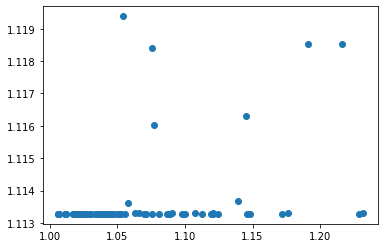

In [44]:
pred2 = reg.predict(X_test)

plt.scatter(y_test, pred2)
plt.show()

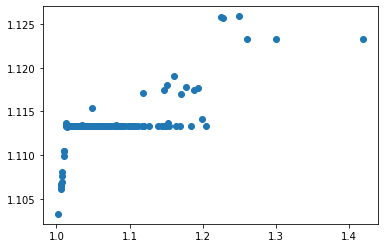

In [45]:
train2 = reg.predict(X_train)

plt.scatter(y_train, train2)
plt.show()

In [46]:
y_test.dtype

dtype('float64')

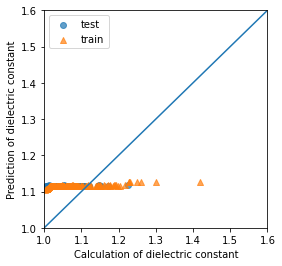

In [39]:
fig = plt.figure(figsize=(4,4), dpi=72, facecolor="w")

x0 = 1
y0 = 1
x10 = 1.6
y10 = 1.6

ax = fig.add_subplot(111)
ax.scatter(y_test, pred2, label="test", marker="o", alpha=0.7)
ax.scatter(y_train, train2, label="train", marker="^", alpha=0.7)
ax.plot((x0,x10),(y0,y10))
ax.set_xlabel("Calculation of dielectric constant")
ax.set_ylabel("Prediction of dielectric constant")
ax.set_xlim(1,1.6)
ax.set_ylim(1,1.6)
plt.legend()
plt.show()


### Machine learning using NN

In [47]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPRegressor

param_dist = {"hidden_layer_sizes":[i for i in range(100,1000,10)],
             "max_iter": [7000],
            }

reg2 = RandomizedSearchCV( estimator=MLPRegressor(),
                                     param_distributions=param_dist,
                                     cv=3,
                                     n_iter=2000,
                                     n_jobs=-1,
                                     verbose=1,
                                     random_state=1
                         )

reg2.fit(X_train, y_train)
reg_best2 = reg2.best_estimator_
print("Best Model Parameter:", reg2.best_params_)
print(reg2.score(X_test,y_test))

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_search.py:278: UserWarning: The total space of parameters 90 is smaller than n_iter=2000. Running 90 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 3 folds for each of 90 candidates, totalling 270 fits


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
reg2.score(X_train,y_train)

In [ ]:
pred3 = reg2.predict(X_test)

plt.scatter(y_test, pred3)
plt.show()

In [ ]:
train3 = reg2.predict(X_train)

### Machine learning using random forest model

In [31]:
#Random search
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from sklearn.metrics import (roc_curve, auc, accuracy_score)
from sklearn.ensemble import RandomForestRegressor

#param_dist = {"max_depth": [3, None],                  #distribution
#              "n_estimators":[50,100,200,300,400,500],

param_dist = {"max_depth": [i for i in range(1,100,1)],                  #distribution
              "n_estimators":[i for i in range(10,1000,10)],
              "max_features": sp_randint(1, 100),
              "min_samples_split": sp_randint(2, 30),
              "min_samples_leaf": sp_randint(1, 30),
#              "bootstrap": [True, False],
#              "criterion": ["gini", "entropy"],
             }

forest_random = RandomizedSearchCV( estimator=RandomForestRegressor(random_state=None),
                                    param_distributions=param_dist,
                                    cv=3,              #CV
                                    n_iter=1000,          #interation num
#                                    scoring="accuracy", #metrics
                                    n_jobs=-1,           #num of core
                                    verbose=1,          
                                    random_state=1)

forest_random.fit(X_train,y_train)
forest_random_best = forest_random.best_estimator_ #best estimator
print("Best Model Parameter: ",forest_random.best_params_)

Fitting 3 folds for each of 1000 candidates, totalling 3000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 450 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 800 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1250 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1800 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 2450 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 3000 out of 3000 | elapsed:  4.1min finished


Best Model Parameter:  {'max_depth': 28, 'max_features': 80, 'min_samples_leaf': 2, 'min_samples_split': 14, 'n_estimators': 20}


In [32]:
pred = forest_random.predict(X_test)
forest_random.score(X_test,y_test)

0.5800667623423423

In [33]:
forest_random.score(X_train,y_train)

0.8107907449060261

In [13]:
pred

array([1.04253544, 1.0517789 , 1.14870433, 1.07318853, 1.12753911,
       1.04315891, 1.02002239, 1.08595849, 1.05203323, 1.05952304,
       1.17322363, 1.08110712, 1.03004495, 1.10128384, 1.14450292,
       1.03201806, 1.10193861, 1.04683646, 1.04333435, 1.02406548,
       1.02302974, 1.07875836, 1.04263778, 1.02376814, 1.01998392,
       1.16588313, 1.04324379, 1.14201531, 1.04240422, 1.06386833,
       1.07353454, 1.01954375, 1.10845588, 1.0604329 , 1.02402282,
       1.14088376, 1.03237192, 1.0188423 , 1.07799337, 1.12207798,
       1.04988362, 1.10077717, 1.09349263, 1.02208594, 1.02091137,
       1.15507952, 1.14147828, 1.01939816, 1.02694136, 1.1550825 ,
       1.02069348, 1.08168905, 1.02095152, 1.04615166, 1.02029924,
       1.14780224, 1.03725374, 1.06142545, 1.02800826, 1.10822661,
       1.10889179, 1.13962312, 1.03758232, 1.04442966, 1.09596502,
       1.13978576, 1.09277733, 1.02137016, 1.09306151])

In [14]:
y_test

array([1.03977339, 1.08650909, 1.15113035, 1.02782405, 1.16936699,
       1.02605014, 1.01297866, 1.08396218, 1.02626729, 1.04247544,
       1.41841285, 1.09912917, 1.0421442 , 1.09042848, 1.19080523,
       1.01714284, 1.08101093, 1.03717315, 1.02223442, 1.01573205,
       1.02179743, 1.08284969, 1.03967558, 1.02674287, 1.02599594,
       1.14578923, 1.0310511 , 1.04903497, 1.04775653, 1.06969422,
       1.05289949, 1.01586576, 1.14830211, 1.04564508, 1.03183812,
       1.19282481, 1.03320857, 1.0153738 , 1.04911855, 1.0812726 ,
       1.06145361, 1.10293278, 1.05553756, 1.02365531, 1.02426239,
       1.05408362, 1.11858476, 1.01724022, 1.0390934 , 1.21596193,
       1.02295548, 1.04585816, 1.01623786, 1.06111797, 1.02015614,
       1.22827692, 1.08882208, 1.02973147, 1.0440387 , 1.06301906,
       1.1017948 , 1.1448491 , 1.02948792, 1.05080402, 1.13911714,
       1.17745153, 1.0923852 , 1.00233126, 1.06347032])

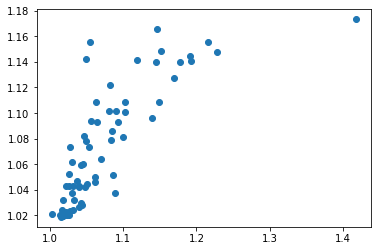

In [15]:
plt.scatter(y_test, pred)
plt.show()

In [450]:
train =forest_random.predict(X_train)
train

array([1.16300569, 1.19661656, 1.13053351, 1.02172201, 1.16620209,
       1.01715297, 1.025009  , 1.06621522, 1.1502301 , 1.07887372,
       1.02697758, 1.08748481, 1.03816523, 1.02255116, 1.02943292,
       1.07076944, 1.0444077 , 1.05651333, 1.03014989, 1.03180781,
       1.1060012 , 1.09819767, 1.09288618, 1.03034259, 1.08975045,
       1.09573135, 1.04443941, 1.01314981, 1.09684151, 1.01484667,
       1.03879378, 1.0780769 , 1.04430455, 1.03659782, 1.03854012,
       1.09361107, 1.10645718, 1.02120926, 1.01239364, 1.04281218,
       1.0379561 , 1.01341023, 1.032062  , 1.01527512, 1.0967177 ,
       1.05988535, 1.01701775, 1.05002048, 1.22690154, 1.01659707,
       1.10045756, 1.03628892, 1.06123379, 1.07942853, 1.07517711,
       1.14155293, 1.12167941, 1.16830203, 1.06012676, 1.05424815,
       1.01958979, 1.03256175, 1.05014074, 1.14344256, 1.19132873,
       1.08770655, 1.04895679, 1.10687129, 1.10156556, 1.04739679,
       1.05601652, 1.04573144, 1.06233496, 1.01774793, 1.12243

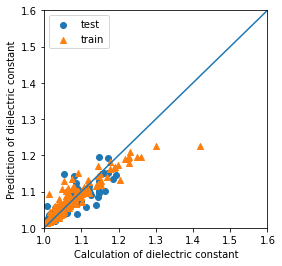

In [451]:
fig = plt.figure(figsize=(4,4), dpi=72, facecolor="w")

x0 = 0.9
y0 = 0.9
x10 = 1.6
y10 = 1.6

ax = fig.add_subplot(111)
ax.scatter(y_test, pred, label="test", marker="o")# c="blue", alpha=0.7, linewidth="1", label="test")
ax.scatter(y_train, train, label="train", marker="^")#, c="red", alpha=0.7, linewidth="1", label="train")
ax.plot((x0,x10),(y0,y10))
ax.set_xlabel("Calculation of dielectric constant")
ax.set_ylabel("Prediction of dielectric constant")
ax.set_xlim(1,1.6)
ax.set_ylim(1,1.6)
ax.legend()

In [48]:
#Random search repeat
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from sklearn.metrics import (roc_curve, auc, accuracy_score)
from sklearn.ensemble import RandomForestRegressor

rm_extract_sum = []


#param_dist = {"max_depth": [3, None],                  #distribution
#              "n_estimators":[50,100,200,300,400,500],

for k in range(100):

    param_dist = {"max_depth": [i for i in range(1,100,1)],                  #distribution
              "n_estimators":[i for i in range(10,1000,10)],
              "max_features": sp_randint(1, 100),
              "min_samples_split": sp_randint(2, 30),
              "min_samples_leaf": sp_randint(1, 30),
#              "bootstrap": [True, False],
#              "criterion": ["gini", "entropy"],
             }

    forest_random = RandomizedSearchCV( estimator=RandomForestRegressor(random_state=None),
                                    param_distributions=param_dist,
                                    cv=5,              #CV
                                    n_iter=500,          #interation num
#                                    scoring="accuracy", #metrics
                                    n_jobs=-1,           #num of core
                                    verbose=1,          
                                    random_state=0)

    forest_random.fit(X_train,y_train)
    forest_random_best = forest_random.best_estimator_ #best estimator
    pred = forest_random.predict(X_test)
    pred_score = forest_random.score(X_test,y_test)
    with open("rm_20210118.txt", "a") as f1:
        print("Best Model Parameter: ",forest_random.best_params_, file=f1)
        print("Train_score",forest_random.score(X_train,y_train), file=f1)
        print("Test_score:",pred_score, file=f1)
    features = pd.DataFrame(X_train).columns
    importances = forest_random_best.feature_importances_
    indices = np.argsort(importances)[::-1]
    importances2 = np.sort(importances)[::-1][0:200]

    indices2 = indices[0:200]
    rm_counts = np.count_nonzero(importances2)
    rm_extract = indices2[:rm_counts:]
    
    rm_extract_sum = np.append(rm_extract_sum,rm_extract)
     
    with open("pd_importances_20210118.txt", "a") as f2:    
        print("vector:",rm_extract, file=f2)
        print("importances:",importances2, file=f2)
    with open("pd_importances_vector_20210118.txt", "a") as f2:    
        print("vector:",rm_extract, file=f2)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   26.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  2.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.5min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.6min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   47.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   40.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   38.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   39.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1818 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.1min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.0min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.0min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.5min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   47.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.7min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   48.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.6min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.7min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   32.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   32.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.8min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   47.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.6min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   45.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.7min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   46.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.6min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   37.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  5.5min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.7min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   47.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  4.7min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   35.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.9min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1790 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2468 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1789 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2462 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.4min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed:  3.3min finished


In [49]:
#Output the current maximum number of visible columns
pd.get_option("display.max_columns")

#Specifying the maximum number of display columns
pd.set_option('display.max_columns', 200)


In [50]:
rm_extract_sum

array([400., 402., 348., ..., 893., 164., 889.])

In [51]:
np.size(rm_extract)

200

In [52]:
np.savetxt("rm_estract_sum.txt", rm_extract_sum)

In [53]:
rm_extract_sum_d = rm_extract_sum.astype(np.int32)
rm_extract_sum_d

array([400, 402, 348, ..., 893, 164, 889], dtype=int32)

In [54]:
rm_extract_sum_bincount = np.bincount(rm_extract_sum_d)
rm_extract_sum_bincount

array([0, 0, 0, ..., 0, 0, 6])

In [55]:
len(rm_extract_sum_bincount)

2079

In [56]:
n = np.arange(0,2079)
n

array([   0,    1,    2, ..., 2076, 2077, 2078])

In [57]:
len(n)

2079

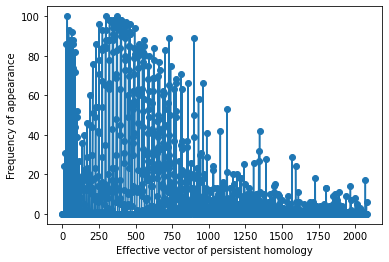

In [58]:
plt.gca().get_xaxis().set_major_locator(ticker.MaxNLocator(integer=True))
plt.xlabel("Effective vector of persistent homology")
plt.ylabel("Frequency of appearance")

plt.plot(n, rm_extract_sum_bincount)
plt.scatter(n, rm_extract_sum_bincount)

In [52]:
rm_extract_sum_ndarray = np.vstack((n, rm_extract_sum_bincount))
rm_extract_sum_ndarray

array([[   0,    1,    2, ..., 2034, 2035, 2036],
       [   0,    0,    0, ...,    0,    0,    1]])

In [53]:
np.shape(rm_extract_sum_ndarray)

(2, 2037)

In [75]:
np.all(rm_extract_sum_ndarray.T > 1, axis=1)

array([False, False, False, ..., False, False, False])

In [76]:
rm_extract_sum_80_ = np.where(rm_extract_sum_bincount > 1)
rm_extract_sum_80_

(array([  26,   34,   43,   53,   64,   75,   76,  102,  103,  118,  148,
         150,  166,  169,  185,  186,  187,  188,  206,  207,  208,  228,
         229,  246,  247,  249,  250,  251,  268,  270,  271,  272,  273,
         274,  292,  294,  295,  296,  297,  298,  317,  318,  319,  320,
         321,  322,  323,  341,  342,  343,  344,  345,  346,  347,  348,
         349,  370,  371,  372,  373,  374,  375,  376,  395,  397,  398,
         399,  400,  401,  402,  403,  404,  422,  424,  426,  427,  428,
         429,  430,  431,  432,  433,  454,  455,  456,  458,  459,  460,
         461,  462,  463,  483,  484,  485,  487,  488,  489,  490,  491,
         492,  493,  494,  514,  520,  521,  522,  523,  524,  525,  526,
         548,  550,  551,  552,  553,  556,  557,  558,  559,  577,  580,
         581,  583,  584,  585,  587,  588,  590,  591,  592,  593,  611,
         616,  618,  620,  621,  622,  623,  624,  625,  627,  628,  650,
         660,  661,  662,  663,  664, 

In [77]:
rm_extract_sum_80 = np.ravel(rm_extract_sum_80_)

np.shape(rm_extract_sum_80)

(179,)

In [78]:
rm_extract_sum_80

array([  26,   34,   43,   53,   64,   75,   76,  102,  103,  118,  148,
        150,  166,  169,  185,  186,  187,  188,  206,  207,  208,  228,
        229,  246,  247,  249,  250,  251,  268,  270,  271,  272,  273,
        274,  292,  294,  295,  296,  297,  298,  317,  318,  319,  320,
        321,  322,  323,  341,  342,  343,  344,  345,  346,  347,  348,
        349,  370,  371,  372,  373,  374,  375,  376,  395,  397,  398,
        399,  400,  401,  402,  403,  404,  422,  424,  426,  427,  428,
        429,  430,  431,  432,  433,  454,  455,  456,  458,  459,  460,
        461,  462,  463,  483,  484,  485,  487,  488,  489,  490,  491,
        492,  493,  494,  514,  520,  521,  522,  523,  524,  525,  526,
        548,  550,  551,  552,  553,  556,  557,  558,  559,  577,  580,
        581,  583,  584,  585,  587,  588,  590,  591,  592,  593,  611,
        616,  618,  620,  621,  622,  623,  624,  625,  627,  628,  650,
        660,  661,  662,  663,  664,  686,  687,  6

In [79]:
pdvects_all3 = pdvects_all2[:,rm_extract_sum_80]
pdvects_all3

array([[-0.23471178, -2.11740835, -1.96019056, ..., -1.4534624 ,
        -1.37217324, -1.01624448],
       [-0.61193401, -2.24209119, -2.11346391, ..., -1.17733742,
        -1.32738362, -1.22726792],
       [-0.72790849, -2.31547594, -2.16911092, ..., -1.2956767 ,
        -1.14822514, -1.08658563],
       ...,
       [ 0.23162769,  0.7410348 ,  0.14870104, ..., -0.30951604,
        -0.34201197, -0.03146841],
       [ 0.36347236,  0.24301592,  0.31271329, ...,  0.47941249,
        -0.02848463, -0.52385644],
       [ 0.58199268,  0.93910239,  0.46370869, ...,  0.08494823,
         0.19546348, -0.1721507 ]])

In [80]:
np.shape(pdvects_all2)

(228, 2080)

In [81]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(pdvects_all3, y, test_size=0.2)

In [82]:
X_train2

array([[-0.5447909 , -2.17013138, -2.01209523, ..., -1.09844457,
        -1.37217324, -1.36795022],
       [-1.05629937, -1.01236216, -0.01221971, ..., -0.38840889,
        -0.8346978 , -0.52385644],
       [ 0.10100381,  0.74032232, -0.02800263, ...,  0.16384108,
         0.50899082,  0.46091963],
       ...,
       [-1.05507858, -1.65073829,  1.97773047, ..., -0.74342673,
        -0.43159121, -0.38317415],
       [-0.68762262, -1.13562005, -0.90777864, ..., -0.78287316,
        -0.87948742, -0.03146841],
       [-0.47154386, -0.11820808,  0.39325502, ..., -0.07283748,
         0.19546348, -0.59419759]])

In [83]:
np.shape(X_train2)

(182, 179)

In [207]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPRegressor

param_dist = {'batch_size': [300, 350, 400, 450],
#               'hidden_layer_sizes': [(150, 150), (100, 100, 50), (150, 100, 50), (200, 200, 200)],
              'hidden_layer_sizes': [(2000, 2000, 2000, 2000, 2000), (1000, 1000, 1000), (2000, 2000, 2000), (1000, 1000, 1000, 1000), (1000, 1000, 1000, 1000,1000)],
              'max_iter': [400, 500, 600, 700, 800],
               'random_state': [0]}

#{"hidden_layer_sizes":[(i for i in range(100,1000,10), i for i in range(100,1000,10)),],
#             "max_iter": [7000],
#              "alpha" : [0.0001, 0,001, 0.01], 
#            }

reg2 = RandomizedSearchCV( estimator=MLPRegressor(),
                                     param_distributions=param_dist,
                                     cv=5,
                                     n_iter=100,
                                     n_jobs=-1,
                                     verbose=1,
#                                     random_state=1
                         )

reg2.fit(X_train2, y_train2)
reg_best2 = reg2.best_estimator_
print("Best Model Parameter:", reg2.best_params_)
print(reg2.score(X_test2,y_test2))
print(reg2.score(X_train2,y_train2))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 37.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 41.5min finished
/home/yohei/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:353: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn("Got `batch_size` less than 1 or larger than "


Best Model Parameter: {'random_state': 0, 'max_iter': 400, 'hidden_layer_sizes': (2000, 2000, 2000, 2000, 2000), 'batch_size': 300}
0.6176212641684888
0.6442051072020665


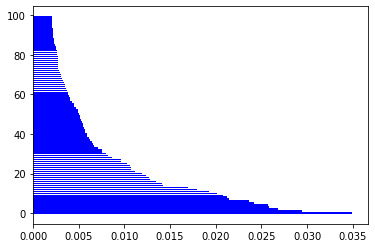

In [429]:
features = pd.DataFrame(X_train).columns
importances = forest_random_best.feature_importances_
indices = np.argsort(importances)[::-1]

importances2 = np.sort(importances)[::-1][0:100]
indices2 = indices[0:100]

#plt.figure(figsize=(100,100))
plt.barh(range(len(indices2)), importances2, color='b', align='center')
#plt.yticks(range(len(indices)), features[indices])
plt.show()

In [430]:
res = np.cumsum(importances2)
res

array([0.03490876, 0.06436182, 0.09114017, 0.11694657, 0.14270863,
       0.16686871, 0.19053634, 0.21201801, 0.23327133, 0.25411412,
       0.27428823, 0.29352488, 0.31148561, 0.32848078, 0.34271888,
       0.35685191, 0.37035723, 0.38314637, 0.39588934, 0.4082054 ,
       0.4201581 , 0.43128031, 0.44205096, 0.45279019, 0.46335151,
       0.47367246, 0.48331209, 0.4929177 , 0.50157776, 0.50977176,
       0.51771995, 0.52528691, 0.53280698, 0.5399212 , 0.54664347,
       0.55319643, 0.55959662, 0.5658032 , 0.57197886, 0.57788742,
       0.58377565, 0.58949443, 0.5951824 , 0.60076314, 0.60622714,
       0.61165121, 0.61695324, 0.62215813, 0.62732558, 0.63248055,
       0.63749003, 0.64239876, 0.6472913 , 0.65194641, 0.65647474,
       0.66092922, 0.66518644, 0.66921584, 0.67323114, 0.67715276,
       0.68102156, 0.68482556, 0.68855604, 0.69220285, 0.6956869 ,
       0.69914845, 0.70254787, 0.7058596 , 0.70898811, 0.71206221,
       0.71510951, 0.71809342, 0.72091272, 0.72369586, 0.72647

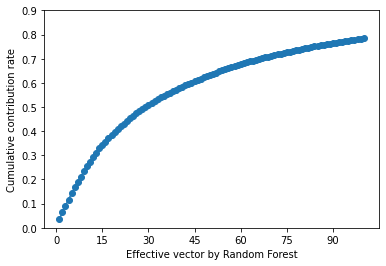

In [433]:
import matplotlib.ticker as ticker

plt.gca().get_xaxis().set_major_locator(ticker.MaxNLocator(integer=True))
plt.xlabel("Effective vector by Random Forest")
plt.ylabel("Cumulative contribution rate")
plt.ylim(0,0.9)
#plt.scatter([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20], res)

plt.plot(np.arange(1,101),res)
plt.scatter(np.arange(1,101), res)

In [208]:
pred2 = reg2.predict(X_test2)
train2 = reg2.predict(X_train2)

No handles with labels found to put in legend.


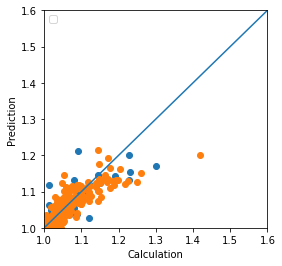

In [209]:
fig = plt.figure(figsize=(4,4), dpi=72, facecolor="w")

x0 = 0.9
y0 = 0.9
x10 = 1.6
y10 = 1.6

ax = fig.add_subplot(111)
ax.scatter(y_test2, pred2)# c="blue", alpha=0.7, linewidth="1", label="test")
ax.scatter(y_train2, train2)#, c="red", alpha=0.7, linewidth="1", label="train")
ax.plot((x0,x10),(y0,y10))
ax.set_xlabel("Calculation")
ax.set_ylabel("Prediction")
ax.set_xlim(1,1.6)
ax.set_ylim(1,1.6)
plt.legend()
plt.show()

In [210]:
#Random search
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint as sp_randint
#from sklearn.metrics import (roc_curve, auc, accuracy_score)
#from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

#param_dist = {"max_depth": [3, None],                  #distribution
#              "n_estimators":[50,100,200,300,400,500],


tuned_parameters = [
    {'C': [0.0001, 0.001, 0.01,0.1, 1, 10, 100, 1000], 'kernel': ['linear']},
    {'C': [0.0001, 0.001, 0.01,0.1, 1, 10, 100, 1000], 'kernel': ['rbf'], 'gamma': [0.001, 0.0001]},
    {'C': [0.0001, 0.001, 0.01,0.1, 1, 10, 100, 1000], 'kernel': ['poly'], 'degree': [2, 3, 4], 'gamma': [0.001, 0.0001]},
    {'C': [0.0001, 0.001, 0.01,0.1, 1, 10, 100, 1000], 'kernel': ['sigmoid'], 'gamma': [0.001, 0.0001]}
    ]

score = 'f1'
reg3 = GridSearchCV(
    SVR(), 
    tuned_parameters,  
    cv=3, 
#    n_iter=1000,
    n_jobs=-1,
    verbose=1
    #scoring='%s_weighted' % score
    ) 


#param_dist = {"C": [0.0001, 0.001, 0.01,0.1,1,10,100, 1000],                  #distribution
#              "gamma":[0.0001, 0.001,0.01,0.1,1,10,100,1000] }

#reg3 = GridSearchCV( estimator=SVR(),
#                     param_dist,
#                     cv=3,              #CV
#                     n_iter=1000,          #interation num
#                                    scoring="accuracy", #metrics
#                     n_jobs=-1,           #num of core
#                     verbose=1,          
#                     random_state=1
#                        )

reg3.fit(X_train2,y_train2)
reg_best = reg3.best_estimator_ #best estimator
print("Best Model Parameter: ",reg3.best_params_)
print(reg3.score(X_test2,y_test2))
print(reg3.score(X_train2,y_train2))


Fitting 3 folds for each of 88 candidates, totalling 264 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    3.1s


Best Model Parameter:  {'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
0.43609442379548324
0.39953039440832305


[Parallel(n_jobs=-1)]: Done 264 out of 264 | elapsed:    4.1s finished


### Two-dimensionalization using som

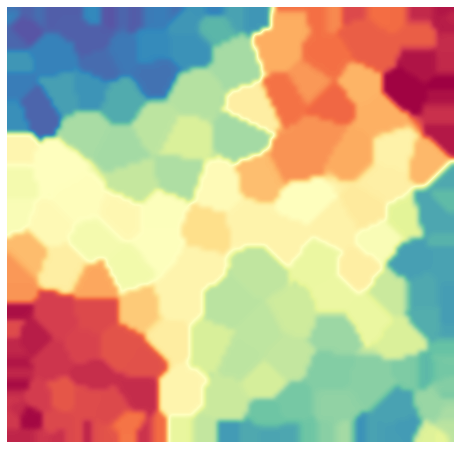

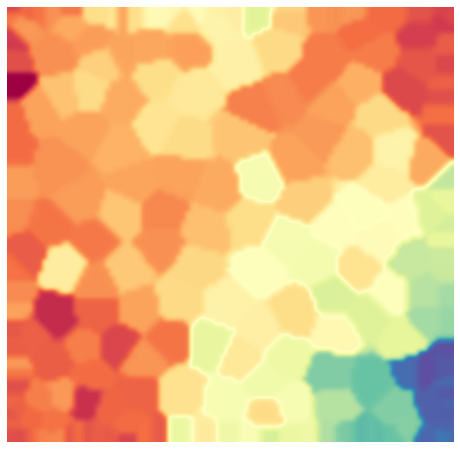

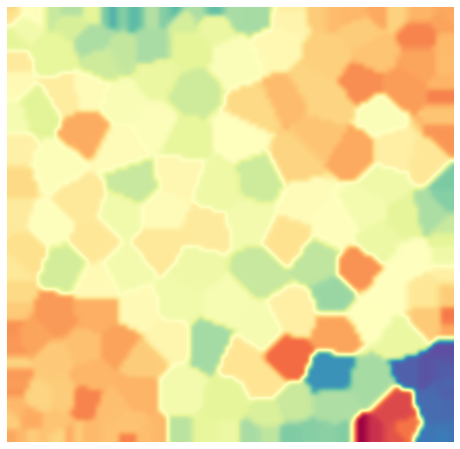

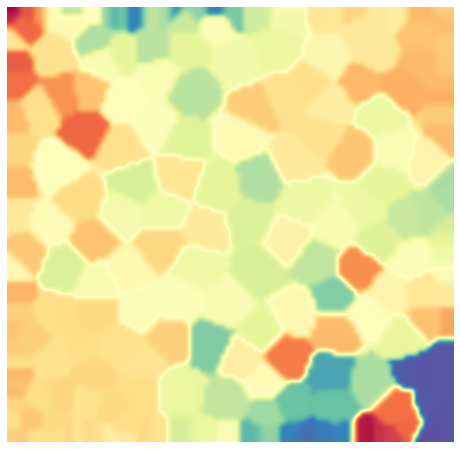

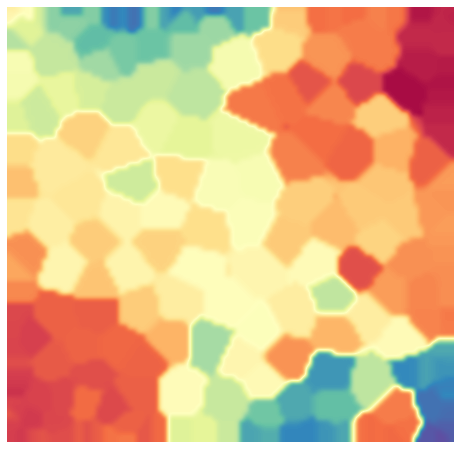

...

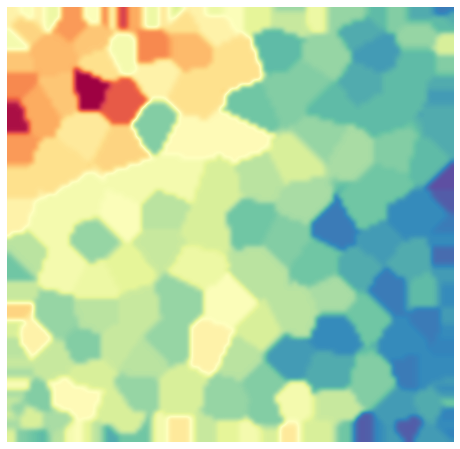

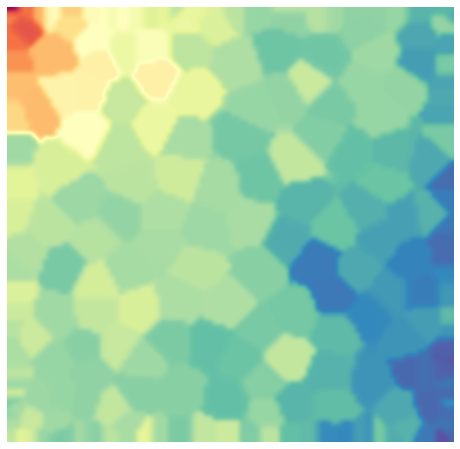

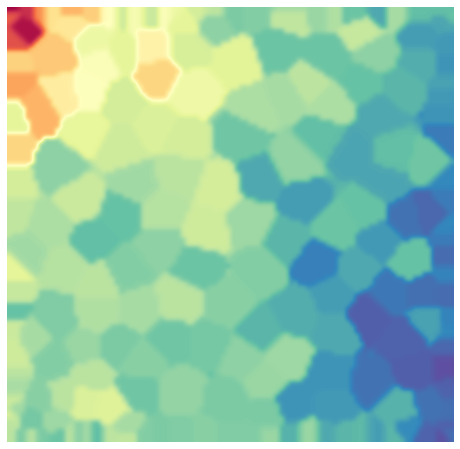

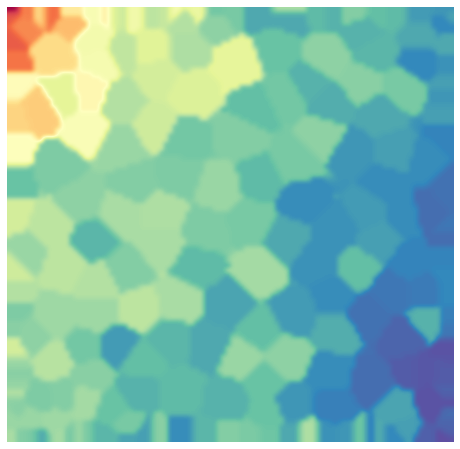

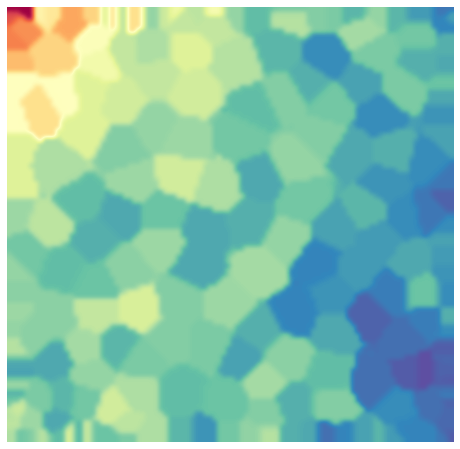

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.8/dist-packages/matplotlib/pyplot.py'>

In [84]:
import somoclu

n_rows, n_columns = 100, 100
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
som.train(pdvects_all3)
som.view_component_planes()

In [85]:
som.get_bmus(som.get_surface_state())

array([[96, 99],
       [99, 91],
       [99, 87],
       [99, 85],
       [87, 83],
       [98, 89],
       [98, 83],
       [99, 81],
       [94, 82],
       [96, 78],
       [94, 78],
       [94, 97],
       [99, 99],
       [99, 98],
       [99, 96],
       [99, 99],
       [98, 92],
       [99, 94],
       [94, 89],
       [99,  2],
       [96,  0],
       [ 0, 99],
       [99,  1],
       [96,  5],
       [90,  1],
       [95, 17],
       [92, 22],
       [96, 20],
       [ 3, 88],
       [ 0, 98],
       [ 1, 98],
       [88,  6],
       [97, 12],
       [97,  7],
       [88, 12],
       [94, 24],
       [ 1, 99],
       [ 1, 86],
       [95, 29],
       [ 1, 84],
       [ 0, 98],
       [ 0, 96],
       [ 5, 99],
       [ 5, 88],
       [ 3, 91],
       [ 1, 77],
       [ 5, 73],
       [ 0, 73],
       [ 2, 69],
       [ 0, 93],
       [13, 98],
       [10, 86],
       [11, 99],
       [17, 98],
       [17, 82],
       [ 8, 79],
       [ 5, 93],
       [16, 99],
       [23, 92

In [86]:
np.shape(som.get_surface_state())

(228, 10000)

In [229]:
np.savetxt("SOM.txt", som.get_surface_state())

In [87]:
y1 = np.round(y, decimals=1)
y1

array([1.1, 1.2, 1.2, 1.2, 1.2, 1.1, 1.1, 1.1, 1.1, 1. , 1. , 1.1, 1.2,
       1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1. , 1. , 1. , 1. , 1. , 1. , 1. ,
       1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. ,
       1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. ,
       1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1.1,
       1.1, 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. ,
       1. , 1.1, 1. , 1. , 1. , 1.1, 1. , 1. , 1.1, 1.1, 1.1, 1.1, 1.1,
       1.1, 1. , 1. , 1.1, 1.1, 1.1, 1.1, 1.1, 1. , 1.2, 1.2, 1.1, 1.1,
       1. , 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1,
       1.1, 1.1, 1.1, 1. , 1. , 1. , 1. , 1.1, 1. , 1.1, 1.1, 1.1, 1.1,
       1.2, 1.2, 1.2, 1.1, 1.4, 1.3, 1.2, 1.3, 1.2, 1.2, 1.1, 1.1, 1.1,
       1.1, 1.1, 1.1, 1.1, 1. , 1.1, 1. , 1.1, 1.1, 1.1, 1. , 1.1, 1.1,
       1.2, 1. , 1.1, 1.1, 1. , 1. , 1.2, 1. , 1.1, 1. , 1.1, 1. , 1.1,
       1.1, 1. , 1.1, 1. , 1.1, 1.1, 1. , 1. , 1. , 1. , 1.1, 1.

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.8/dist-packages/matplotlib/pyplot.py'>

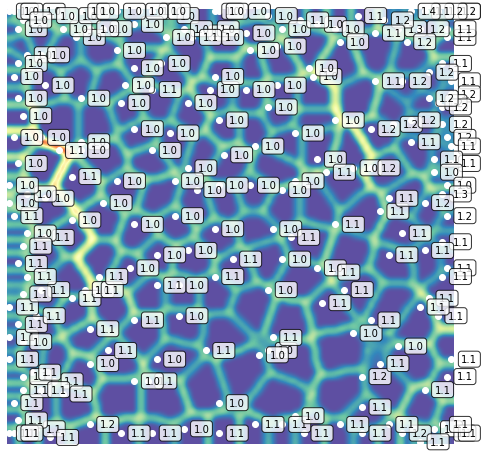

In [106]:
n_rows, n_columns = 100, 100
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
som.train(pdvects_all3)
som.view_umatrix( bestmatches=True,labels=y1,
                     filename="umatrix.png")

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.8/dist-packages/matplotlib/pyplot.py'>

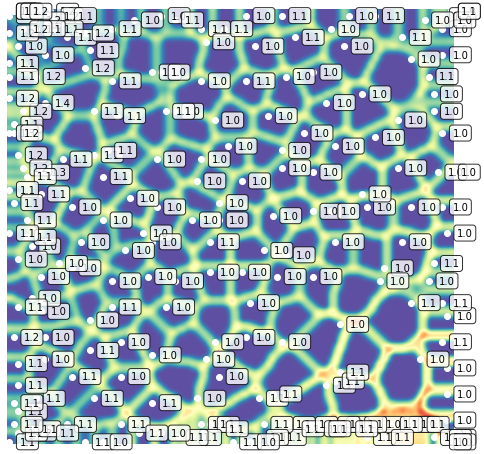

In [98]:
n_rows, n_columns = 100, 100
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
som.train(pdvects_all2)
som.view_umatrix( bestmatches=True,labels=y1,
                     filename="umatrix2.png")

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.8/dist-packages/matplotlib/pyplot.py'>

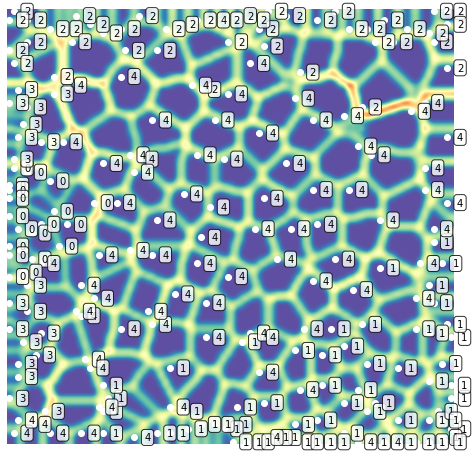

In [89]:
som.view_umatrix( bestmatches=True,labels=y_label,
                     filename="umatrix_label.png")

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.8/dist-packages/matplotlib/pyplot.py'>

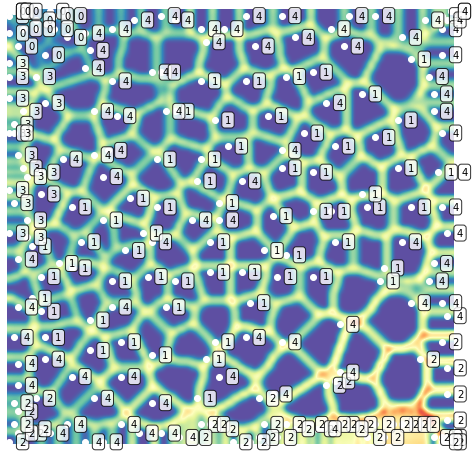

In [99]:
som.view_umatrix( bestmatches=True,labels=y_label,
                     filename="umatrix_label2.png")

In [110]:
SOM_vector = som.get_bmus(som.get_surface_state())
SOM_vector

array([[99, 16],
       [86, 26],
       [81, 27],
       [97, 26],
       [98, 29],
       [90, 30],
       [99, 31],
       [99, 35],
       [95, 34],
       [95, 37],
       [98, 40],
       [97, 12],
       [99, 19],
       [96, 21],
       [98, 24],
       [94, 14],
       [94, 20],
       [88, 16],
       [90, 25],
       [54,  9],
       [45, 18],
       [ 0,  0],
       [53, 18],
       [46, 15],
       [47, 25],
       [64, 28],
       [64, 39],
       [68, 15],
       [ 4, 10],
       [ 1,  0],
       [ 6,  0],
       [55, 31],
       [58, 22],
       [60, 17],
       [60,  8],
       [73, 25],
       [ 2,  4],
       [15,  6],
       [69, 34],
       [ 8, 17],
       [ 3,  2],
       [ 7, 10],
       [12,  4],
       [21,  4],
       [14,  4],
       [16, 20],
       [ 7, 29],
       [26, 17],
       [ 2, 12],
       [18,  4],
       [32,  0],
       [28,  3],
       [27,  3],
       [36,  4],
       [43,  5],
       [28, 13],
       [16,  0],
       [34,  0],
       [45,  4

In [109]:
np.shape(SOM_vector)

(228, 2)

In [101]:
import GPy
from sklearn.datasets import make_friedman2
from pmlearn.gaussian_process import GaussianProcessRegressor
from pmlearn.gaussian_process.kernels import DotProduct, WhiteKernel

ImportError: cannot import name 'sliding_window_view' from 'numpy.lib.stride_tricks' (/usr/local/lib/python3.8/dist-packages/numpy/lib/stride_tricks.py)

In [111]:
y_ = np.array(y).reshape(-1,1)
y_

array([[1.05408362],
       [1.18867284],
       [1.17745153],
       [1.19282481],
       [1.17063452],
       [1.1448491 ],
       [1.147685  ],
       [1.11858476],
       [1.07697557],
       [1.04903497],
       [1.01344656],
       [1.07556949],
       [1.16033186],
       [1.15113035],
       [1.19080523],
       [1.22560828],
       [1.21596193],
       [1.24927047],
       [1.22827692],
       [1.0153738 ],
       [1.01724022],
       [1.0061696 ],
       [1.01205201],
       [1.01087698],
       [1.01864735],
       [1.01215573],
       [1.00640363],
       [1.0184576 ],
       [1.01681518],
       [1.00675374],
       [1.03222667],
       [1.02554789],
       [1.00601529],
       [1.01498606],
       [1.02295548],
       [1.01123896],
       [1.0080444 ],
       [1.01659358],
       [1.00761531],
       [1.00233126],
       [1.0301098 ],
       [1.00760745],
       [1.01028621],
       [1.01586576],
       [1.02727596],
       [1.03002307],
       [1.01330018],
       [1.006

### Illustrated by gaussian process regression

 /usr/local/lib/python3.8/dist-packages/GPy/plotting/matplot_dep/plot_definitions.py:184: UserWarning:The following kwargs were not used by contour: 'label', 'linewidth'


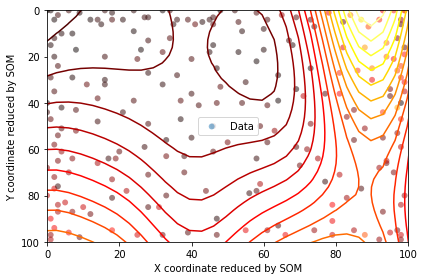

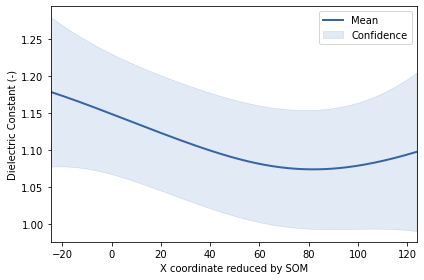

In [113]:
kernel = GPy.kern.Matern52(2, ARD=True)

model = GPy.models.GPRegression(SOM_vector,y_, kernel)
model.optimize(messages=True, max_iters=1e5)
model.plot()
plt.xlabel("X coordinate reduced by SOM")
plt.ylabel("Y coordinate reduced by SOM")
plt.xlim(0,100)
plt.ylim(100,0)
plt.show()

model.plot(fixed_inputs=[(0, 100)], plot_data=False)
plt.xlabel("X coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.show()

## prediction
x_pred = np.array([np.linspace(-3, 3, 100), np.linspace(3, -3, 100)]).T
y_qua_pred = model.predict_quantiles(x_pred, quantiles=(2.5, 50, 97.5))[0]

In [119]:
newX = np.arange(80,100)[:,None]
newX = np.hstack([newX,np.ones_like(newX)])
newY = np.arange(80,100)[:,None]
newY = np.hstack([newY,np.ones_like(newY)])
noise_dict = {'output_index':newX[:,1:].astype(int)}
print(model.predict(newX,Y_metadata=noise_dict))

(array([[1.15924714],
       [1.16897947],
       [1.17821103],
       [1.18677329],
       [1.19449907],
       [1.20122852],
       [1.20681599],
       [1.21113624],
       [1.21409043],
       [1.21561102],
       [1.21566443],
       [1.21425219],
       [1.2114099 ],
       [1.20720111],
       [1.20170961],
       [1.19503261],
       [1.18727524],
       [1.17854501],
       [1.168946  ],
       [1.15857385]]), array([[0.00161124],
       [0.00160762],
       [0.00160372],
       [0.00159968],
       [0.00159559],
       [0.00159151],
       [0.00158745],
       [0.0015834 ],
       [0.0015793 ],
       [0.00157511],
       [0.00157079],
       [0.00156644],
       [0.00156228],
       [0.00155885],
       [0.00155703],
       [0.00155822],
       [0.00156444],
       [0.00157837],
       [0.00160348],
       [0.001644  ]]))


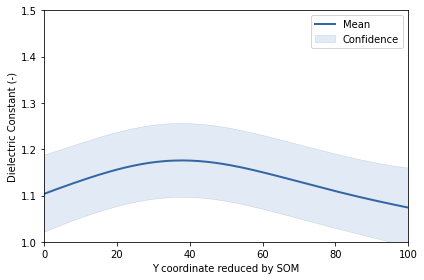

In [108]:
model.plot(fixed_inputs=[(0, 0)], plot_data=False)
plt.xlabel("Y coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

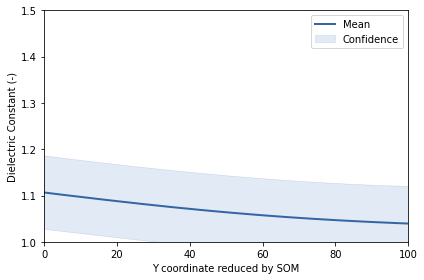

In [304]:
model.plot(fixed_inputs=[(0, 50)], plot_data=False)
plt.xlabel("Y coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

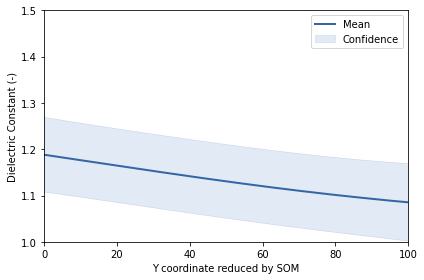

In [312]:
model.plot(fixed_inputs=[(0, 100)], plot_data=False)
plt.xlabel("Y coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

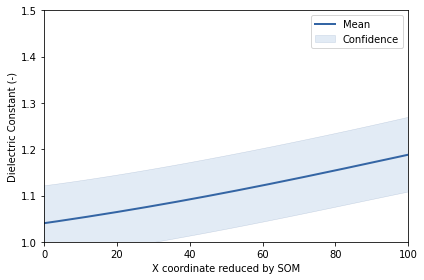

In [306]:
model.plot(fixed_inputs=[(1, 0)], plot_data=False)
plt.xlabel("X coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

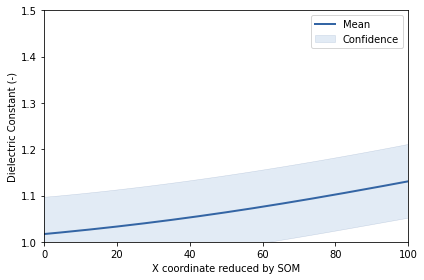

In [307]:
model.plot(fixed_inputs=[(1, 50)], plot_data=False)
plt.xlabel("X coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

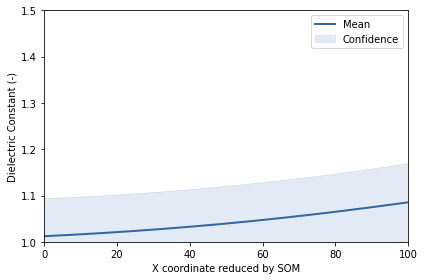

In [308]:
model.plot(fixed_inputs=[(1, 100)], plot_data=False)
plt.xlabel("X coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

In [398]:
pdvects_all4 = np.array([
    [np.dot(pdvects_all3[i,:], pdvects_all3[j,:]) for j in range(pdvects_all3.shape[0])]
    for i in range(pdvects_all3.shape[0])])

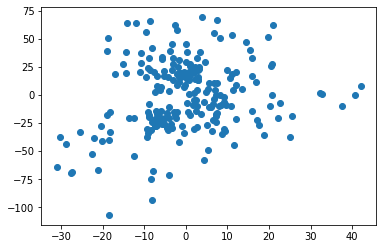

In [399]:
from sklearn import manifold
mds = manifold.MDS(n_components=2, dissimilarity="precomputed", random_state=6)
pos = mds.fit_transform(pdvects_all4)
plt.scatter(pos[:, 0], pos[:, 1], marker = 'o')

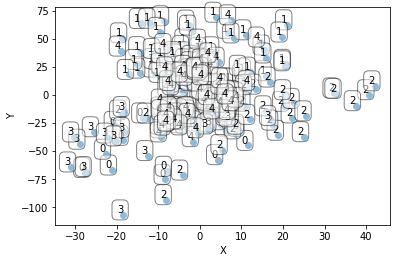

In [407]:
plt.scatter(pos[:, 0], pos[:, 1], marker = 'o')

plt.xlabel("X")
plt.ylabel("Y")
for label, x, y in zip(y_label, pos[:, 0], pos[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(0, 0),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.5)
#        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0')
    )

plt.show()

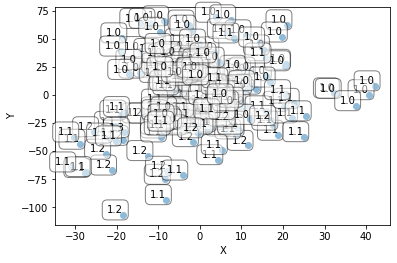

In [409]:
plt.scatter(pos[:, 0], pos[:, 1], marker = 'o')

plt.xlabel("X")
plt.ylabel("Y")
for label, x, y in zip(y1, pos[:, 0], pos[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(0, 0),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.5)
#        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0')
    )

plt.show()

 /home/yohei/.local/lib/python3.6/site-packages/GPy/plotting/matplot_dep/plot_definitions.py:184: UserWarning:The following kwargs were not used by contour: 'label', 'linewidth'


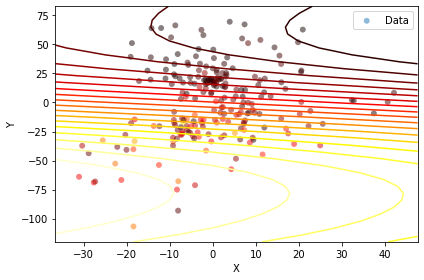

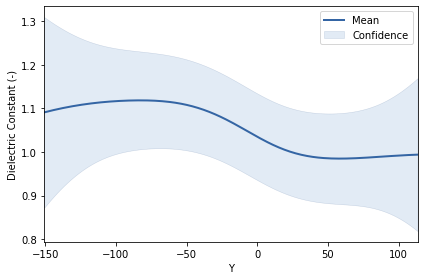

In [410]:
kernel = GPy.kern.Matern52(2, ARD=True)

model = GPy.models.GPRegression(pos,y_, kernel)
model.optimize(messages=True, max_iters=1e5)
model.plot()
plt.xlabel("X")
plt.ylabel("Y")
#plt.xlim(0,100)
#plt.ylim(100,0)
plt.show()

model.plot(fixed_inputs=[(0, 100)], plot_data=False)
plt.xlabel("Y")
plt.ylabel("Dielectric Constant (-)")
plt.show()

## prediction
x_pred = np.array([np.linspace(-3, 3, 100), np.linspace(3, -3, 100)]).T
y_qua_pred = model.predict_quantiles(x_pred, quantiles=(2.5, 50, 97.5))[0]

Automatically created module for IPython interactive environment


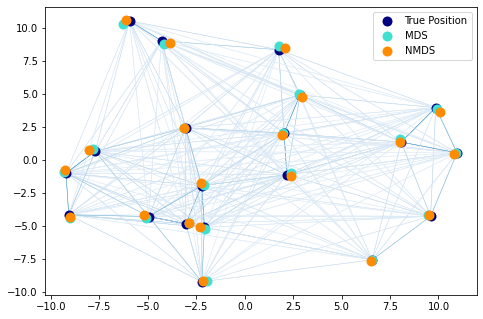

In [333]:
print(__doc__)
import numpy as np

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

from sklearn import manifold
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA

EPSILON = np.finfo(np.float32).eps
n_samples = 20
seed = np.random.RandomState(seed=3)
X_true = seed.randint(0, 20, 2 * n_samples).astype(float)
X_true = X_true.reshape((n_samples, 2))
# Center the data
X_true -= X_true.mean()

similarities = euclidean_distances(X_true)

# Add noise to the similarities
noise = np.random.rand(n_samples, n_samples)
noise = noise + noise.T
noise[np.arange(noise.shape[0]), np.arange(noise.shape[0])] = 0
similarities += noise

mds = manifold.MDS(n_components=2, max_iter=3000, eps=1e-9, random_state=seed,
                   dissimilarity="precomputed", n_jobs=1)
pos = mds.fit(similarities).embedding_

nmds = manifold.MDS(n_components=2, metric=False, max_iter=3000, eps=1e-12,
                    dissimilarity="precomputed", random_state=seed, n_jobs=1,
                    n_init=1)
npos = nmds.fit_transform(similarities, init=pos)

# Rescale the data
pos *= np.sqrt((X_true ** 2).sum()) / np.sqrt((pos ** 2).sum())
npos *= np.sqrt((X_true ** 2).sum()) / np.sqrt((npos ** 2).sum())

# Rotate the data
clf = PCA(n_components=2)
X_true = clf.fit_transform(X_true)

pos = clf.fit_transform(pos)

npos = clf.fit_transform(npos)

fig = plt.figure(1)
ax = plt.axes([0., 0., 1., 1.])

s = 100
plt.scatter(X_true[:, 0], X_true[:, 1], color='navy', s=s, lw=0,
            label='True Position')
plt.scatter(pos[:, 0], pos[:, 1], color='turquoise', s=s, lw=0, label='MDS')
plt.scatter(npos[:, 0], npos[:, 1], color='darkorange', s=s, lw=0, label='NMDS')
plt.legend(scatterpoints=1, loc='best', shadow=False)

similarities = similarities.max() / (similarities + EPSILON) * 100
np.fill_diagonal(similarities, 0)
# Plot the edges
start_idx, end_idx = np.where(pos)
# a sequence of (*line0*, *line1*, *line2*), where::
#            linen = (x0, y0), (x1, y1), ... (xm, ym)
segments = [[X_true[i, :], X_true[j, :]]
            for i in range(len(pos)) for j in range(len(pos))]
values = np.abs(similarities)
lc = LineCollection(segments,
                    zorder=0, cmap=plt.cm.Blues,
                    norm=plt.Normalize(0, values.max()))
lc.set_array(similarities.flatten())
lc.set_linewidths(np.full(len(segments), 0.5))
ax.add_collection(lc)

plt.show()

In [338]:
X_true
np.shape(noise)

(20, 20)

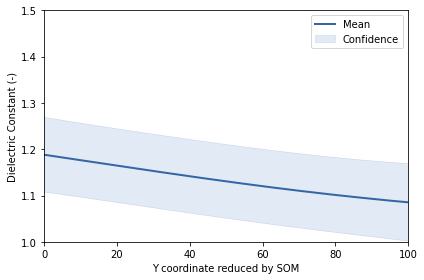

In [305]:
model.plot(fixed_inputs=[(0, 100)], plot_data=False)
plt.xlabel("Y coordinate reduced by SOM")
plt.ylabel("Dielectric Constant (-)")
plt.xlim(0,100)
plt.ylim(1,1.5)
plt.show()

kernel = GPy.kern.Matern52(2, ARD=True)

model = GPy.models.GPRegression(X2_,y_, kernel)
model.optimize(messages=True, max_iters=1e5)
model.plot()
plt.xlabel("1st effective persistent vector")
plt.ylabel("2nd effective persistent vector")
plt.show()

model.plot(fixed_inputs=[(1, 20)], plot_data=False)
plt.xlabel("2nd Effective Persitent Vector")
plt.ylabel("Dielectric Constant (-)")
plt.show()

## prediction
x_pred = np.array([np.linspace(-3, 3, 100), np.linspace(3, -3, 100)]).T
y_qua_pred = model.predict_quantiles(x_pred, quantiles=(2.5, 50, 97.5))[0]

pd_inverse = pd_vects_std[:,(206,313,188,394,118,610,401,453,519,204,206,313,368,421,961,165,102,1376,317,207,587,88)]
#pd_inverse = pdvects2[:,(206,313)]
pd_inverse

In [119]:
list_pd=np.array[188,118,401,519,206,368,961,102,317,317,317,587,859,297,420,288,421,63,103,317,62,340,117,425,183,289,340,313,134,289,693,101,269,188,366,289,169,204,224,103,165,397,205,224,591,662,366,367,188,368,297,266,225,223,983,166,247,510,267,295,292,133,366,348,366,1174,693,313,295,399,294,168,517,220,589,165,185,134,315,88,243,835,225,462,133,246,118,88,312,364,188,115,188,244,148,510,224,86,169,101,394,610,453,204,313,421,165,1376,207,207,184,88,165,88,132,817,88,392,186,479,270,205,366,391,101,717,418,1174,100,149,392,167,859,243,63,662,494,575,165,421,221,337,225,320,149,593,943,510,247,167,366,244,693,369,134,618,524,268,1273,270,738,292,132,26,62,392,1174,224,147,169,349,147,610,53,315,292,364,226,859,246,250,433,575,134,165,103,401,43,203,63,204,185,208,205,511,584,88,62,493,296]


TypeError: 'builtin_function_or_method' object is not subscriptable

In [118]:
#indices3 = pdvects_all2[:,[188,118, 401, 519, 206, 368, 961, 102, 317, 587]]
indices3 = pdvects_all2[:,[188,118,401,519,206,368,961,102,317,317,317,587,859,297,420,288,421,63,103,317,62,340,117,425,183,289,340,313,134,289,693,101,269,188,366,289,169,204,224,103,165,397,205,224,591,662,366,367,188, 368,297,266,225,223,983,166,247,510,267,295,292,133,366,348,366,1174,693,313,295,399,294,168,517,220,589,165,185,134,315,88,243,835,225,462,133,246,118,88,312,364,188,115,188,244,148,510,224,86,169,101,394,610,453,204,313,421,165,1376,207,207,184,88,165,88,132,817,88,392,186,479,270,205,366,391,101,717,418,1174,100,149,392,167,859,243,63,662,494,575,165,421,221,337,225,320,149,593,943,510,247,167,366,244,693,369,134,618,524,268,1273,270,738,292,132,26,62,392,1174,224,147,169,349,147,610,53,315,292,364,226,859,246,250,433,575,134,165,103,401,43,203,63,204,185,208,205,511,584,88,62,493,296]]
indices3

array([[-1.6529054 , -1.65392081, -1.49392841, ..., -1.37155072,
        -1.58920802, -1.70558058],
       [-1.47640677, -1.51739372, -1.60081639, ..., -1.42433595,
        -1.23522167, -1.52665008],
       [-1.38139443, -1.44689098, -0.91367941, ..., -1.39794334,
        -1.1846522 , -1.37328108],
       ...,
       [ 0.41658218,  0.5353749 ,  0.56748253, ...,  0.34396935,
         0.57263716,  0.21153188],
       [ 0.41559246,  0.44567903,  0.93395558, ...,  0.58150289,
         0.67377612,  0.40579928],
       [ 0.46078931,  0.40818846,  0.70490992, ...,  0.44953981,
         0.69906086,  0.46203458]])

In [411]:
a = np.zeros_like(pdvects_all2)
a

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [412]:
#for i in  (188,118, 401, 519, 206, 368, 961, 102, 317):
for i in rm_extract_sum_80:
    a[:,i]=pdvects_all2[:,i]
#a[0,indices3]=pdvects_all3
a

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [413]:
_a = np.sum(abs(a), axis=0)
_a

array([0., 0., 0., ..., 0., 0., 0.])

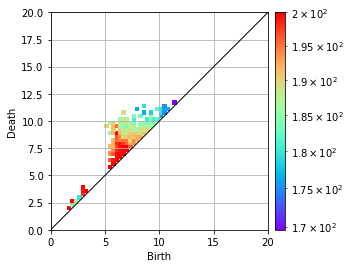

In [425]:
mesh = hc.PIVectorizerMesh((0, 20), 64, sigma=0.002, weight=("atan", 0.01, 3))
a_pd = mesh.histogram_from_vector(_a).plot(colorbar={"type": "log","max":200})

In [440]:
coef = _a
pdextract = mesh.mask_from_vector(coef)

In [441]:
coef

array([0., 0., 0., ..., 0., 0., 0.])

In [442]:
pdlist_ = hc.PDList("/mnt/h/data/20200824_1/pd/p000.idiagram")
pd_ = pdlist_.dth_diagram(2)
pdextract_pairs = pdextract.filter_pd(pd_)
pdextract_pairs

[Pair(1.8736342698665476, 1.8750032054457069),
 Pair(1.8733844935747794, 1.8750104706012802),
 Pair(1.871607233149873, 1.8750109564735908),
 Pair(1.8734442453532738, 1.8750211156446943),
 Pair(1.8643226657991556, 1.8750339271356797),
 Pair(1.8644622315741597, 1.8750345805215307),
 Pair(1.8485722937907885, 1.875037813308081),
 Pair(1.874943437125982, 1.875038968070243),
 Pair(1.856844728415674, 1.8750482407660836),
 Pair(1.8712638590907722, 1.8750503867268422),
 Pair(1.86923338849097, 1.8750523499930107),
 Pair(1.874784767635628, 1.8750569699756916),
 Pair(1.854117037657242, 1.8750658970450385),
 Pair(1.8745972809049913, 1.8750741895967118),
 Pair(1.870591050069112, 1.8750780974357877),
 Pair(1.8606034963933002, 1.8750947797478164),
 Pair(1.8591879668293028, 1.875095263612551),
 Pair(1.8653381650613863, 1.8750965765278709),
 Pair(1.8689709104431462, 1.875102144504025),
 Pair(1.8380413173346928, 1.875112137699695),
 Pair(1.8730693232386817, 1.875113368101631),
 Pair(1.8723536083044034, 1

In [443]:
len(pdextract_pairs)

99861

In [446]:
#0.1% presents
pdextract_pairs_random = np.random.choice(pdextract_pairs, 100, replace=False)
pdextract_pairs_random

array([Pair(9.90595021327143, 10.011017451079523),
       Pair(3.4091033199373686, 3.582486608342041),
       Pair(6.166059021674462, 6.488037751026204),
       Pair(9.042538633027483, 9.069904324843318),
       Pair(2.4167641710463625, 2.5146852740584746),
       Pair(5.385118563700718, 7.798314398475984),
       Pair(2.4928721405614733, 2.7894200776500426),
       Pair(2.4567534115248373, 2.6036151802899785),
       Pair(5.852219649538376, 6.049891612493795),
       Pair(2.7294125557382127, 2.855584992685713),
       Pair(2.7641918986359917, 2.863647493742494),
       Pair(3.235881323721016, 3.7239215446049334),
       Pair(7.180290556455221, 7.220331870633528),
       Pair(6.2239728440463065, 6.936780965358875),
       Pair(5.564796240507016, 5.797012877742622),
       Pair(3.116482904230567, 3.12867701824373),
       Pair(10.570847714845039, 10.626199829674727),
       Pair(3.3648314998369386, 3.4659336376414625),
       Pair(3.3786422019678675, 3.6131730566618727),
       Pair(5.9

In [447]:
optimal_volume_pdextract = [pair.optimal_volume() for pair in pdextract_pairs_random]

In [448]:
pv.show([
    hc.OptimalVolume.to_paraview_node_for_volumes(
        optimal_volume_pdextract,
        gui_name="Optimal volume: blue 0"
    ).threshold("isboundary", 1).set_color((0, 0, 1)).set_linewidth(1),
    pv.PointCloud("homcloud_p000_out.txt", dim=3, delimiters=" "),
], wait=False)